<a href="https://colab.research.google.com/github/Jom123410/Data-Analytics-Projects-/blob/main/unemployment_rates_in_US.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The Jupyter notebook is designed to offer a comprehensive analysis and prediction of unemployment rates using a data-driven approach. This notebook encompasses a series of steps starting from data visualization, preprocessing, feature selection, model training using CatBoost (a gradient boosting library that excels with categorical features), and finally, interpretation of the model predictions with SHAP (SHapley Additive exPlanations) values.

Here's a structured overview of what the notebook covers:

#Introduction
The economic health of a country is often gauged by its unemployment rate, making it a critical metric for policymakers and economists. Accurately predicting and understanding the factors influencing unemployment rates can lead to more informed decisions and strategies. This notebook employs a robust machine learning pipeline to tackle the challenge of forecasting unemployment rates.

##Data Visualization with AutoViz
The initial step involves an exploratory data analysis (EDA) performed automatically using the AutoViz library, enabling us to identify patterns, outliers, and correlations in the dataset without manual plotting. This step ensures a thorough understanding of the data's characteristics and prepares us for preprocessing.

##Data Preprocessing
Data preprocessing includes cleaning, encoding categorical variables, handling missing values, and any transformations necessary to make the data suitable for modeling. This phase is crucial for the effectiveness of the machine learning models.

##Feature Selection
Identifying the most relevant features that influence the unemployment rate is performed through an analysis, ensuring that the model focuses on significant predictors and reduces the complexity of the model.

##Model Training with CatBoost
The notebook then proceeds to train a CatBoostRegressor model. CatBoost is chosen for its efficiency with categorical data and its capability of handling various types of data without extensive data preprocessing. The model is tuned to predict unemployment rates accurately.

##Model Interpretation with SHAP
Understanding why the model makes certain predictions is as crucial as the predictions themselves. SHAP values are used to interpret the CatBoost model's predictions, offering insights into the impact of each feature on the unemployment rate predictions. This interpretability helps in validating the model and provides actionable insights.

# Importing libraries and loading data

In [7]:
# Install Python packages using pip.

# The "!pip" command allows you to run shell commands in Jupyter Notebook or Colab cells.
# It is used here to install Python packages.
# The "-q" flag stands for "quiet," which means it will suppress output during installation.
# "feature_engine," "autoviz," and "dataprep" are the packages being installed.
# The "2>/dev/null" part redirects any error messages (stderr) to the null device, effectively silencing them.
# This is often used when you want to hide installation messages.
!pip install -q feature_engine autoviz dataprep 2>/dev/null

In [8]:
pip install shap

In [9]:
pip install catboost

  Using cached catboost-1.2.3-cp310-cp310-manylinux2014_x86_64.whl (98.5 MB)


In [75]:
# Import necessary libraries
import numpy as np  # Import NumPy for handling numerical operations
import pandas as pd  # Import Pandas for data manipulation and analysis
import warnings  # Import Warnings to suppress unnecessary warnings

# Suppress warning messages
warnings.filterwarnings("ignore")

# Import AutoViz from the autoviz library for automated visualization of data
from autoviz import AutoViz_Class

# Import load_dataset and create_report from the dataprep library for data loading and EDA
from dataprep.datasets import load_dataset
from dataprep.eda import create_report

# Import SHAP for interpreting model predictions
import shap

# Import matplotlib for data visualization
import matplotlib.pyplot as plt

# Import CatBoostRegressor for building a regression model
from catboost import Pool, CatBoostRegressor

# Import mean_squared_error for evaluating model performance
from sklearn.metrics import mean_squared_error

# Import train_test_split for splitting the data into training and testing sets
from sklearn.model_selection import train_test_split

# Import RareLabelEncoder from feature_engine.encoding for encoding categorical features
from feature_engine.encoding import RareLabelEncoder

# Import CountVectorizer from sklearn.feature_extraction.text for text feature extraction
from sklearn.feature_extraction.text import CountVectorizer

# Import ast and re for working with text and regular expressions
import ast
import re

# Set Pandas options to display a maximum of 1000 rows
pd.set_option('display.max_rows', 1000)

In [83]:
from sklearn.model_selection import train_test_split
from catboost import CatBoostRegressor, Pool
from sklearn.metrics import mean_squared_error

In [12]:
%%time
df = pd.read_csv('/content/unemployed_population_1978-12_to_2023-07.csv')  # Reads the CSV file into a Pandas DataFrame
item0 = df.shape[0]  # Stores the initial number of rows in the DataFrame
df = df.drop_duplicates()  # Removes duplicate rows from the DataFrame
item1 = df.shape[0]  # Stores the number of rows after removing duplicates
print(f"There are {item0-item1} duplicates found in the dataset")  # Prints the number of duplicates that were removed

# Rename columns to make easier conversion later
#format: race|gender|education|age
column_mapping = {
    "all": "all|all|all|all",
    "16-24": "all|all|all|16_24",
    "25-54": "all|all|all|25_54",
    "55-64": "all|all|all|55_64",
    "65+": "all|all|all|65_",
    "less_than_hs": "all|all|less_than_hs|all",
    "high_school": "all|all|high_school|all",
    "some_college": "all|all|some_college|all",
    "bachelor's_degree": "all|all|bachelors_degree|all",
    "advanced_degree": "all|all|advanced_degree|all",
    "women": "all|women|all|all",
    "women_16-24": "all|women|all|16_24",
    "women_25-54": "all|women|all|25_54",
    "women_55-64": "all|women|all|55_64",
    "women_65+": "all|women|all|65_",
    "women_less_than_hs": "all|women|less_than_hs|all",
    "women_high_school": "all|women|high_school|all",
    "women_some_college": "all|women|some_college|all",
    "women_bachelor's_degree": "all|women|bachelors_degree|all",
    "women_advanced_degree": "all|women|advanced_degree|all",
    "men": "all|men|all|all",
    "men_16-24": "all|men|all|16_24",
    "men_25-54": "all|men|all|25_54",
    "men_55-64": "all|men|all|55_64",
    "men_65+": "all|men|all|65_",
    "men_less_than_hs": "all|men|less_than_hs|all",
    "men_high_school": "all|men|high_school|all",
    "men_some_college": "all|men|some_college|all",
    "men_bachelor's_degree": "all|men|bachelors_degree|all",
    "men_advanced_degree": "all|men|advanced_degree|all",
    "black": "black|all|all|all",
    "black_16-24": "black|all|all|16_24",
    "black_25-54": "black|all|all|25_54",
    "black_55-64": "black|all|all|55_64",
    "black_65+": "black|all|all|65_",
    "black_less_than_hs": "black|all|less_than_hs|all",
    "black_high_school": "black|all|high_school|all",
    "black_some_college": "black|all|some_college|all",
    "black_bachelor's_degree": "black|all|bachelors_degree|all",
    "black_advanced_degree": "black|all|advanced_degree|all",
    "black_women": "black|women|all|all",
    "black_women_16-24": "black|women|all|16_24",
    "black_women_25-54": "black|women|all|25_54",
    "black_women_55-64": "black|women|all|55_64",
    "black_women_65+": "black|women|all|65_",
    "black_women_less_than_hs": "black|women|less_than_hs|all",
    "black_women_high_school": "black|women|high_school|all",
    "black_women_some_college": "black|women|some_college|all",
    "black_women_bachelor's_degree": "black|women|bachelors_degree|all",
    "black_women_advanced_degree": "black|women|advanced_degree|all",
    "black_men": "black|men|all|all",
    "black_men_16-24": "black|men|all|16_24",
    "black_men_25-54": "black|men|all|25_54",
    "black_men_55-64": "black|men|all|55_64",
    "black_men_65+": "black|men|all|65_",
    "black_men_less_than_hs": "black|men|less_than_hs|all",
    "black_men_high_school": "black|men|high_school|all",
    "black_men_some_college": "black|men|some_college|all",
    "black_men_bachelor's_degree": "black|men|bachelors_degree|all",
    "black_men_advanced_degree": "black|men|advanced_degree|all",
    "hispanic": "hispanic|all|all|all",
    "hispanic_16-24": "hispanic|all|all|16_24",
    "hispanic_25-54": "hispanic|all|all|25_54",
    "hispanic_55-64": "hispanic|all|all|55_64",
    "hispanic_65+": "hispanic|all|all|65_",
    "hispanic_less_than_hs": "hispanic|all|less_than_hs|all",
    "hispanic_high_school": "hispanic|all|high_school|all",
    "hispanic_some_college": "hispanic|all|some_college|all",
    "hispanic_bachelor's_degree": "hispanic|all|bachelors_degree|all",
    "hispanic_advanced_degree": "hispanic|all|advanced_degree|all",
    "hispanic_women": "hispanic|women|all|all",
    "hispanic_women_16-24": "hispanic|women|all|16_24",
    "hispanic_women_25-54": "hispanic|women|all|25_54",
    "hispanic_women_55-64": "hispanic|women|all|55_64",
    "hispanic_women_65+": "hispanic|women|all|65_",
    "hispanic_women_less_than_hs": "hispanic|women|less_than_hs|all",
    "hispanic_women_high_school": "hispanic|women|high_school|all",
    "hispanic_women_some_college": "hispanic|women|some_college|all",
    "hispanic_women_bachelor's_degree": "hispanic|women|bachelors_degree|all",
    "hispanic_women_advanced_degree": "hispanic|women|advanced_degree|all",
    "hispanic_men": "hispanic|men|all|all",
    "hispanic_men_16-24": "hispanic|men|all|16_24",
    "hispanic_men_25-54": "hispanic|men|all|25_54",
    "hispanic_men_55-64": "hispanic|men|all|55_64",
    "hispanic_men_65+": "hispanic|men|all|65_",
    "hispanic_men_less_than_hs": "hispanic|men|less_than_hs|all",
    "hispanic_men_high_school": "hispanic|men|high_school|all",
    "hispanic_men_some_college": "hispanic|men|some_college|all",
    "hispanic_men_bachelor's_degree": "hispanic|men|bachelors_degree|all",
    "hispanic_men_advanced_degree": "hispanic|men|advanced_degree|all",
    "white": "white|all|all|all",
    "white_16-24": "white|all|all|16_24",
    "white_25-54": "white|all|all|25_54",
    "white_55-64": "white|all|all|55_64",
    "white_65+": "white|all|all|65_",
    "white_less_than_hs": "white|all|less_than_hs|all",
    "white_high_school": "white|all|high_school|all",
    "white_some_college": "white|all|some_college|all",
    "white_bachelor's_degree": "white|all|bachelors_degree|all",
    "white_advanced_degree": "white|all|advanced_degree|all",
    "white_women": "white|women|all|all",
    "white_women_16-24": "white|women|all|16_24",
    "white_women_25-54": "white|women|all|25_54",
    "white_women_55-64": "white|women|all|55_64",
    "white_women_65+": "white|women|all|65_",
    "white_women_less_than_hs": "white|women|less_than_hs|all",
    "white_women_high_school": "white|women|high_school|all",
    "white_women_some_college": "white|women|some_college|all",
    "white_women_bachelor's_degree": "white|women|bachelors_degree|all",
    "white_women_advanced_degree": "white|women|advanced_degree|all",
    "white_men": "white|men|all|all",
    "white_men_16-24": "white|men|all|16_24",
    "white_men_25-54": "white|men|all|25_54",
    "white_men_55-64": "white|men|all|55_64",
    "white_men_65+": "white|men|all|65_",
    "white_men_less_than_hs": "white|men|less_than_hs|all",
    "white_men_high_school": "white|men|high_school|all",
    "white_men_some_college": "white|men|some_college|all",
    "white_men_bachelor's_degree": "white|men|bachelors_degree|all",
    "white_men_advanced_degree": "white|men|advanced_degree|all"
}

df = df.rename(columns=column_mapping)

# convert wide to narrow dataframe
df = pd.melt(df, id_vars=['date', 'population_over_16'], var_name='Combined_code', value_name='Unemployment')

df['Race'] = df['Combined_code'].apply(lambda x: x.split('|')[0])
df['Gender'] = df['Combined_code'].apply(lambda x: x.split('|')[1])
df['Education'] = df['Combined_code'].apply(lambda x: x.split('|')[2])
df['Age'] = df['Combined_code'].apply(lambda x: x.split('|')[3])

# extract year from date
df['date'] = pd.to_datetime(df['date'])
df['Year'] = df['date'].dt.year

# Select only specific columns of interest
selected_cols = ['Unemployment', 'Race', 'Gender','Education', 'Age', 'Year']
df = df[selected_cols]

print(df.shape)  # Prints the dimensions (rows and columns) of the filtered DataFrame
df.sample(5).T  # Displays a random sample of 5 rows transposed for better visibility

There are 0 duplicates found in the dataset
(64320, 6)
CPU times: user 287 ms, sys: 30 ms, total: 317 ms
Wall time: 430 ms


,22529,34821,43892,19185,42848
Unemployment,6.9,5.1,21.0,19.8,5.2
Race,black,hispanic,hispanic,black,hispanic
Gender,women,all,men,all,women
Education,all,all,all,less_than_hs,advanced_degree
Age,25_54,65_,16_24,all,all
Year,2022,1980,1983,1988,1981


In [13]:
df.nunique()

Unemployment    373
Race              4
Gender            3
Education         6
Age               5
Year             46
dtype: int64

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64320 entries, 0 to 64319
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unemployment  64320 non-null  float64
 1   Race          64320 non-null  object 
 2   Gender        64320 non-null  object 
 3   Education     64320 non-null  object 
 4   Age           64320 non-null  object 
 5   Year          64320 non-null  int64  
dtypes: float64(1), int64(1), object(4)
memory usage: 2.9+ MB


# Data visualisation

In [15]:
# Import the AutoViz_Class
from autoviz.AutoViz_Class import AutoViz_Class

# Initialize AutoViz_Class
AV = AutoViz_Class()

# Specify the filename of the dataset
filename = "your_dataset.csv"

# Load your dataset using pandas
df = pd.read_csv('/content/unemployed_population_1978-12_to_2023-07.csv')

# Specify the target variable for analysis
target_variable = 'Unemployment'

# Specify the directory to save custom plots
custom_plot_dir = "custom_plot_directory"

# Perform automated EDA using the AutoViz library
dft = AV.AutoViz(
    filename='',
    sep=",",
    depVar=target_variable,
    dfte=df,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="html",
    max_rows_analyzed=min([df.shape[0], 10**4]),
    max_cols_analyzed=min([df.shape[1], 50]),
    save_plot_dir=custom_plot_dir
)


Shape of your Data Set loaded: (536, 122)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  120
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  2
    Number of Columns to Delete =  0
    122 Predictors classified...
        2 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['date', 'population_over_16']
Since Number of Rows in data 536 e

In [16]:
# Import the necessary library for displaying HTML content
from IPython.core.display import display, HTML

# Import the pathlib library to work with file paths
from pathlib import Path

# Initialize an empty list to store file names
file_names = []

# Use pathlib to iterate through HTML files in a specific directory
for file in Path(f'/kaggle/working/{custom_plot_dir}/{target_variable}/').glob('*.html'):

    # Extract the filename from the full path and add it to the list
    filename = str(file).split('/')[-1]
    file_names.append(filename)

# Iterate through the list of file names and display each HTML file
for file_name in file_names:

    # Construct the full file path for each HTML file
    file_path = f'/kaggle/working/{custom_plot_dir}/{target_variable}/{file_name}'

    # Open the HTML file for reading
    with open(file_path, 'r') as file:

        # Read the content of the HTML file
        html_content = file.read()

        # Display the HTML content using IPython
        display(HTML(html_content))

ERROR:bokeh.core.validation.check:E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'hispanic_wome...ree', 'hispanic_men_...ree'


DataPrep Report
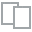
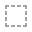
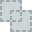
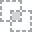
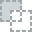
...
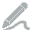
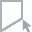
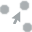
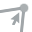
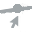

In [17]:
create_report(df)

# Data transformation

In [18]:
# Accessing DataFrame columns
# This line of code retrieves the column names from a DataFrame called 'df'.
# It allows you to access and work with the names of the columns in the DataFrame.

df.columns

Index(['date', 'all', '16-24', '25-54', '55-64', '65+', 'less_than_hs',
       'high_school', 'some_college', 'bachelor's_degree',
       ...
       'white_men_16-24', 'white_men_25-54', 'white_men_55-64',
       'white_men_65+', 'white_men_less_than_hs', 'white_men_high_school',
       'white_men_some_college', 'white_men_bachelor's_degree',
       'white_men_advanced_degree', 'population_over_16'],
      dtype='object', length=122)

In [19]:
df.sample(5).T

,428,228,93,199,316
date,1987-11-01,2004-07-01,2015-10-01,2006-12-01,1997-03-01
all,6.3,5.7,5.4,4.6,5.4
16-24,12.4,12.0,11.8,10.5,12.0
25-54,5.1,4.8,4.5,3.8,4.3
55-64,3.5,3.9,3.9,3.0,3.3
65+,2.5,3.6,4.0,2.9,3.5
less_than_hs,12.5,11.9,11.3,9.9,12.4
high_school,6.3,6.4,6.8,5.4,5.7
some_college,5.2,5.0,5.2,4.0,4.3
bachelor's_degree,2.8,3.4,3.1,2.5,2.5


In [20]:
# Display information about the DataFrame 'df'
# This includes the data types, non-null values, and memory usage
# Useful for getting a quick overview of the dataset's structure
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 536 entries, 0 to 535
Columns: 122 entries, date to population_over_16
dtypes: float64(120), int64(1), object(1)
memory usage: 511.0+ KB


In [68]:
%%time

# Select the main label.
main_label = 'Unemployment'

print(df.shape)  # Print the shape of the resulting DataFrame.
df.sample(5).T  # Display a sample of 5 rows, transposed for easier readability.

(536, 122)
CPU times: user 5.16 ms, sys: 0 ns, total: 5.16 ms
Wall time: 5.1 ms


,423,289,98,393,283
date,1988-04-01,1999-06-01,2015-05-01,1990-10-01,1999-12-01
all,5.9,4.4,5.8,5.5,4.2
16-24,11.8,10.2,12.7,11.1,9.9
25-54,4.8,3.3,4.8,4.4,3.2
55-64,3.4,2.7,4.1,3.3,2.7
65+,2.4,3.3,4.4,3.0,3.1
less_than_hs,11.8,10.3,12.0,11.1,10.0
high_school,6.0,4.6,7.1,5.6,4.5
some_college,4.7,3.4,5.6,4.4,3.3
bachelor's_degree,2.6,2.1,3.5,2.6,2.1


# Machine learning

In [87]:
# Assuming 'df' is your DataFrame and 'main_label' is the name of your target variable
if main_label in df.columns:
    y = df[main_label].values.reshape(-1, 1) # Ensuring y is correctly shaped
    X = df.drop(columns=[main_label])
    cat_cols = X.select_dtypes(include=['object', 'category']).columns.tolist()
    cat_cols_idx = [X.columns.get_loc(col) for col in cat_cols]

    # Splitting the data, note: if this is a regression task, do not use stratify
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=0)

else:
    print(f"The column '{main_label}' does not exist in the DataFrame.")


The column 'Unemployment' does not exist in the DataFrame.
X_train data type: <class 'numpy.ndarray'>
X_test data type: <class 'numpy.ndarray'>


In [69]:
# Load your training and testing data into X_train, y_train, X_test, and y_test
# Replace the following lines with your actual data loading code:

X_train = np.random.rand(100, 5)  # Replace with your actual training data
y_train = np.random.rand(100)  # Replace with your actual training labels
X_test = np.random.rand(50, 5)  # Replace with your actual testing data
y_test = np.random.rand(50)  # Replace with your actual testing labels

In [72]:
print(f"X_train data type: {type(X_train)}")
print(f"X_test data type: {type(X_test)}")

X_train data type: <class 'numpy.ndarray'>
X_test data type: <class 'numpy.ndarray'>


In [79]:
# Replace cat_cols_idx with the indices of categorical features in your data:

cat_cols_idx = [0, 2]  # Replace with the actual indices of categorical features

In [81]:
X_train = X_train.astype('int')
X_test = X_test.astype('int')

In [88]:
%%time

# Initialize the training and testing data pools using CatBoost's Pool class
train_pool = Pool(X_train,
                  y_train,
                  cat_features=cat_cols_idx)  # Create a training data pool with categorical features
test_pool = Pool(X_test,
                 y_test,
                 cat_features=cat_cols_idx)  # Create a testing data pool with categorical features

# Specify the training parameters for the CatBoostRegressor model
model = CatBoostRegressor(iterations=2000,    # Number of boosting iterations
                          depth=5,           # Maximum depth of trees in the ensemble
                          verbose=0,         # Set verbosity level to 0 (no output during training)
                          learning_rate=0.1,  # Learning rate for gradient boosting
                          loss_function='RMSE')  # Loss function to optimize (Root Mean Squared Error)

# Train the CatBoostRegressor model on the training data
model.fit(train_pool)

# Make predictions using the trained model on both the training and testing data
y_train_pred = model.predict(train_pool)  # Predictions on the training data
y_test_pred = model.predict(test_pool)    # Predictions on the testing data

# Calculate and print the Root Mean Squared Error (RMSE) scores for training and testing data
rmse_train = mean_squared_error(y_train, y_train_pred, squared=False)  # RMSE for training data
rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)     # RMSE for testing data

# Print the RMSE scores rounded to three decimal places
print(f"RMSE score for train: {round(rmse_train,3)}")
print(f"RMSE score for test: {round(rmse_test,3)}")

CatBoostError: /src/catboost/catboost/libs/data/quantization.cpp:2420: All features are either constant or ignored.

In [ ]:
# Calculate the baseline RMSE (Root Mean Squared Error) scores for the training and test datasets.

# For the training dataset:

# Calculate the RMSE by comparing the actual target values (y_train) with the predicted values,
# where the predicted values are the mean of the training target values repeated for each data sample.
rmse_bs_train = mean_squared_error(y_train, [np.mean(y_train)]*len(y_train), squared=False)

# For the test dataset:

# Calculate the RMSE by comparing the actual target values (y_test) with the predicted values,
# where the predicted values are the mean of the training target values repeated for each test data sample.
rmse_bs_test = mean_squared_error(y_test, [np.mean(y_train)]*len(y_test), squared=False)

# Print the baseline RMSE scores for both the training and test datasets, rounded to 3 decimal places.
print(f"RMSE baseline score for train {round(rmse_bs_train,3)} percentage points, and for test {round(rmse_bs_test,3)} percentage points")

# Explanations with SHAP values

In [ ]:
%matplotlib inline

In [ ]:
%%time
# Initialize the SHAP library for visualization
shap.initjs()

# Create a TreeExplainer object for the 'model' (assumes 'model' is a tree-based model like a Random Forest or XGBoost)
ex = shap.TreeExplainer(model)

# Calculate SHAP values for the 'X_test' data using the TreeExplainer
shap_values = ex.shap_values(X_test)

# Generate a summary plot to visualize the impact of features on model predictions
shap.summary_plot(shap_values, X_test)

In [ ]:
# Calculate the expected values (e.g., predicted ratings) using a variable named 'ex.expected_value'.
expected_values = ex.expected_value

# Print the average predicted label.
print(f"Average predicted unemployment is {round(expected_values, 3)} percentage points")

# Calculate the average actual label from 'y_test'.
actual_label_avg = round(np.mean(y_test),3)

# Print the average actual label.
print(f"Average actual unemployment is {actual_label_avg} percentage points")

In [ ]:
# Define a function named 'show_shap' that visualizes SHAP values for a specific feature.
# Parameters:
#   - col: The name of the feature for which SHAP values will be visualized.
#   - shap_values: SHAP values calculated for the model's predictions.
#   - label: The label to be displayed in the plot title.
#   - X_test: The DataFrame containing the test data.
#   - ylabel: The label for the y-axis in the plot (default is 'points').
def show_shap(col, shap_values=shap_values, label=main_label, X_test=X_test, ylabel='percentage points'):
    # Create a copy of the test data DataFrame.
    df_infl = X_test.copy()

    # Add a new column 'shap_' to the DataFrame containing SHAP values for the specified feature.
    df_infl['shap_'] = shap_values[:, df_infl.columns.tolist().index(col)]

    # Calculate the mean SHAP values and standard deviation grouped by the specified feature.
    gain = round(df_infl.groupby(col)['shap_'].mean(), 4)
    gain_std = round(df_infl.groupby(col)['shap_'].std(), 4)

    # Count the number of data points for each category of the specified feature.
    cnt = df_infl.groupby(col)['shap_'].count()

    # Create a dictionary containing the feature, mean SHAP values, standard deviation, and count.
    dd_dict = {'col': list(gain.index), 'gain': list(gain.values), 'gain_std': list(gain_std.values), 'count': cnt}

    # Create a DataFrame from the dictionary and sort it by 'gain' in descending order.
    df_res = pd.DataFrame.from_dict(dd_dict).sort_values('gain', ascending=False).set_index('col')

    # Create a plot to visualize the SHAP values with error bars.
    plt.figure(figsize=(9, 6))
    plt.errorbar(df_res.index, df_res['gain'], yerr=df_res['gain_std'], fmt="o", color="r")

    # Set plot title and axis labels.
    plt.title(f'SHAP values for column {col}, label {label}')
    plt.ylabel(ylabel)
    plt.tick_params(axis="x", rotation=90)

    # Display the plot and the DataFrame with results.
    plt.show()
    print(df_res)

    # Return the function.
    return

# Loop through the columns in the test data.
for col in X_test.columns:
    print()  # Print an empty line for better readability.
    print(col)  # Print the name of the current column.
    print()  # Print another empty line for separation.

    # Call the 'show_shap' function to visualize SHAP values for the current column.
    show_shap(col, shap_values, label=main_label, X_test=X_test)